# eRIVERS Example iPython Notebook
  The purpose of this notebook is to demonstrate how to import and run the various portions of our eRivers project.  



## Necessary Packages to Install:
* matplotlib
* pandas
* Bokeh
* scikit-learn
* numpy
* statsmodels

Here are two ways to install packages:

### 1. If you are already an Anaconda user, you can simply run the command:

conda install bokeh

This will install the most recent published Bokeh release from the Continuum Analytics Anaconda repository, along with all dependencies.

### 2. Alternatively, it is possible to install from PyPI using pip:

pip install bokeh

#### First, we need to import our python files necessary to run our code in an iPython notebook. 

In [3]:
%cd Analysis/
from regression import *
from data_cleaning_utils import *
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Image
%matplotlib inline

/Users/Will/Documents/GITHUB/class_project/class_project/Analysis


For this walkthrough, we will use a .csv that contains in-situ chemical data collected form the Mississippi River.  See image below for data on how the samples were collected.

### Data Inport and Cleaning

The first portion of our code deals with importing the data, recognizing the time variable and providing tools to allow the user to clean the data.

In [4]:
%cd ../Data/mississippi
%ls

/Users/Will/Documents/GITHUB/class_project/class_project/Data/mississippi
UMR_Day42015-08-04.csv                callback.html
UMR_Day42015-08-04_Nulls_Removed.csv  shapefiles/


The data_import function attempts to automatically recognize the date format, but asks the user for input as well.  It returns a pandas dataframe of the raw imported data indexed by the datetime column.

In [42]:
raw_data_miss = import_data('UMR_Day42015-08-04_Nulls_Removed.csv')
%cd ../Amazon/
raw_data_amz = import_data('TROCAS2_clean.csv')

Index(['ltime', 'Latitude', 'Longitude', 'Temp', 'fDOMQSU', 'ODOsat', 'ODOmgL',
       'pH', 'CH4uM', 'CO2uM', 'Cond', 'indicator'],
      dtype='object')
What is your datetime column?ltime
/Users/Will/Documents/GITHUB/class_project/class_project/Data/Amazon
Index(['datetime', 'Latitude', 'Longitude', 'fDOMQSU', 'ODOsat', 'ODOmgL',
       'Temp', 'Cond', 'pH', 'CO2uM', 'CH4uM', 'indicator'],
      dtype='object')
What is your datetime column?datetime


In [43]:
raw_data_miss = nullRemover(raw_data_miss)
raw_data_amz = nullRemover(raw_data_amz)

(26334, 12)
(26334, 12)
(16417, 12)
(16417, 12)


### Data Smoothing
We created a smoothing function that applys a running mean to our time series data.  This tool allows the user to input the window for the running mean.  It also outputs a simple time-series of the data before and after the smoothing to allow the user to determine the optimum window size

What size windows do you want for the moving average? 45


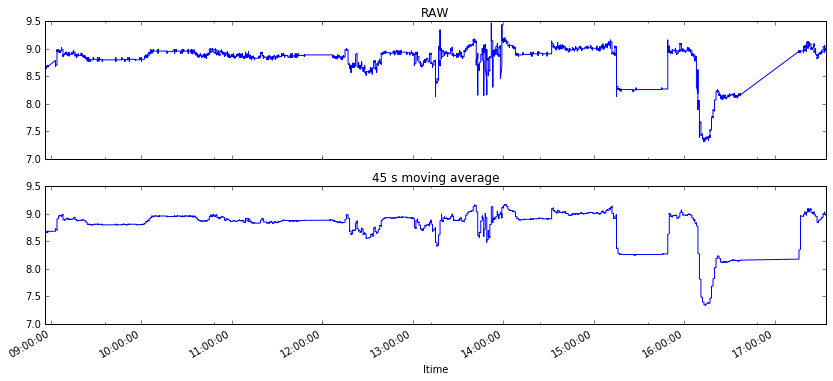

In [44]:
cleaned_miss= test_smooth_data("pH", raw_data_miss)

Using a 45 second window removes a significant amount of noise from the data without removing the rapidly occuring trends that we see in the data.

In [46]:
cleaned_miss = nullRemover(cleaned_miss)

(26290, 12)
(26290, 12)


### Data Reducing
We have also made a function to allow the user to resample the data.  Depending on the original time-step, the user can either up-sample(more coverage) or down-sample(more sparse data).  

In [47]:
resample = reducer(cleaned_miss)

What frequency would you like to resample to? Format = XS(seconds), XT(minutes)4T
Mississippi
Value Error
Num Samples Before: 315480
Num Samples After: 1300


### Time Series Visualization
Now that the data has been imported and cleaned, we have created a tool that can interactively visualize these time series for simple data exploration

In [17]:
%cd ../../Analysis/timeseries
import TimeSeries as ts
%cd ../../Data/mississippi/
data = pd.read_csv('UMR_Day42015-08-04_Nulls_Removed.csv')
data.head()



/Users/Will/Documents/GITHUB/class_project/class_project/Analysis/timeseries
/Users/Will/Documents/GITHUB/class_project/class_project/Data/mississippi


,ltime,Latitude,Longitude,Temp,fDOMQSU,ODOsat,ODOmgL,pH,CH4uM,CO2uM,Cond,indicator
0,8/4/15 8:56,43.664773,-91.238209,22.6392,80.448,97.81,8.35761,8.70,0.239870,11.897216,408.02,Mississippi
1,8/4/15 8:56,43.664777,-91.238210,22.6382,80.440,97.68,8.35128,8.69,0.250415,11.900610,408.22,Mississippi
2,8/4/15 8:56,43.664780,-91.238211,22.6354,80.480,97.65,8.34495,8.69,0.228742,11.775067,407.76,Mississippi
3,8/4/15 8:56,43.664783,-91.238211,22.6334,80.488,97.52,8.36229,8.69,0.219063,11.757889,407.38,Mississippi
4,8/4/15 8:56,43.664787,-91.238209,22.6324,80.508,97.49,8.36596,8.69,0.244385,11.918703,407.84,Mississippi


In [49]:
ts.timeplot(data)

Loading BokehJS ...

## Statistics
We also developed several tools to analyze correlations between the parameters and help visualize underlying trends in the data

In [56]:
regression_miss_data = cleaned_miss.drop(['Latitude', 'Longitude', 'indicator'], axis=1)

regression_miss_data.head()


,ltime,Temp,fDOMQSU,ODOsat,ODOmgL,pH,CH4uM,CO2uM,Cond
ltime,,,,,,,,,
2015-08-04 08:57:00,2015-08-04 08:57:00,22.617387,80.712533,96.760667,8.321806,8.686556,0.287032,12.030600,408.943111
2015-08-04 08:57:00,2015-08-04 08:57:00,22.616973,80.721111,96.696889,8.317733,8.686111,0.288896,12.036452,408.986667
2015-08-04 08:57:00,2015-08-04 08:57:00,22.616644,80.730178,96.635333,8.313578,8.685889,0.290252,12.041881,409.019778
2015-08-04 08:57:00,2015-08-04 08:57:00,22.616360,80.738267,96.576000,8.309342,8.685333,0.292405,12.054681,409.056889
2015-08-04 08:57:00,2015-08-04 08:57:00,22.616142,80.745867,96.515778,8.304802,8.684444,0.295090,12.065228,409.108667


The following function runs a random model with a random independent variable y and four random covariates, using both the statsmodels and scikit-learn packages. The user can compare output from the two tools.

In [57]:
from regression import compare_OLS
compare_OLS(regression_miss_data)

statsmodels OLS regression on 
 ODOsat ~ CH4uM + ODOmgL + fDOMQSU + Temp

                             OLS Regression Results                            
Dep. Variable:                 ODOsat   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                 8.194e+06
Date:                Mon, 21 Mar 2016   Prob (F-statistic):               0.00
Time:                        13:25:40   Log-Likelihood:                -31055.
No. Observations:               26290   AIC:                         6.212e+04
Df Residuals:                   26285   BIC:                         6.216e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [95.0% Conf. Int.]
--------------------------------------------------------

The two models produce the same results. 

The `user_model` function prompts the user to input a model formula for an OLS regression, then runs the model in `statsmodel`, and outputs model results and a plot of y data vs. model fitted values.

At the prompt, you may either input your own model formula, or copy and paste the following formula as an example:

`CO2uM ~ pH + Temp + CH4uM`

The data set contains the following covariates: 

['ltime', 'Temp', 'fDOMQSU', 'ODOsat', 'ODOmgL', 'pH', 'CH4uM', 'CO2uM', 'Cond'] 

Enter your regression model formula, using syntax as shown: 
 
 dependent_variable ~ covariate1 + covariate 2 + ... 
 
CO2uM ~ pH + Temp + CH4uM

                             OLS Regression Results                            
Dep. Variable:                  CO2uM   R-squared:                       0.882
Model:                            OLS   Adj. R-squared:                  0.882
Method:                 Least Squares   F-statistic:                 6.573e+04
Date:                Mon, 21 Mar 2016   Prob (F-statistic):               0.00
Time:                        13:25:53   Log-Likelihood:                -96525.
No. Observations:               26290   AIC:                         1.931e+05
Df Residuals:                   26286   BIC:                         1.931e+05
Df Model:                           3                                         
Covarianc

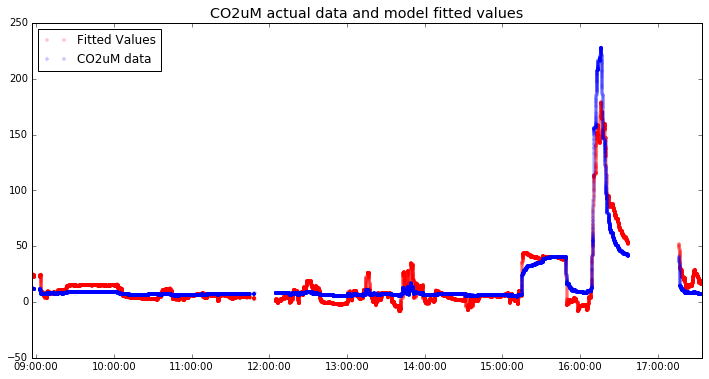

In [58]:
from regression import user_model
user_model(data=regression_miss_data)

We have also developed a visualization tool that will automatically plot all data columns verses eachother to allow a user to view trends in the data.   The functions takes a min and max R^2 value as an argument to allow the user to set cutoffs for uncorrelated columns

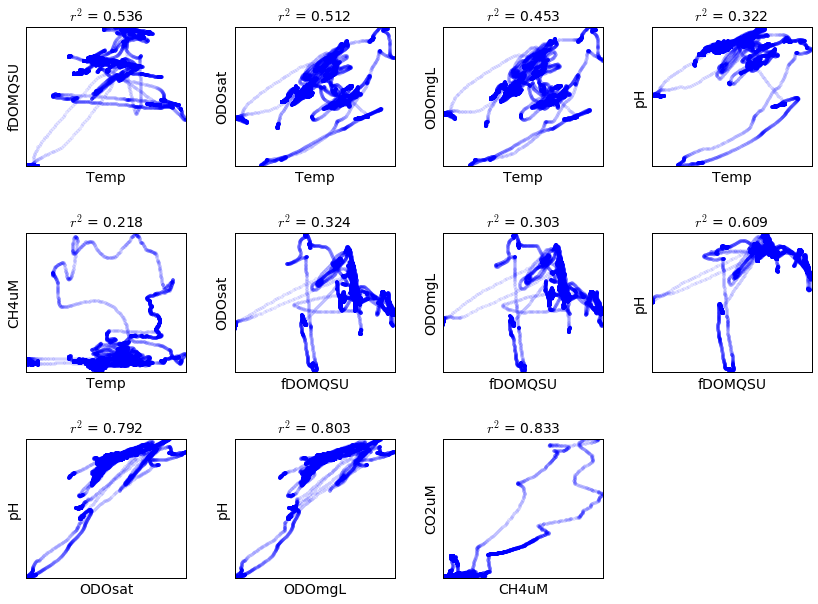

In [59]:
from regression import plot_pairs
plot_pairs(data=regression_miss_data, minCorr=0.2, maxCorr=.98)